# Chord diagram

In [143]:
import pandas as pd
import numpy as np

In [144]:
def combine_hex_values(d):
    d_items = sorted(d.items())
    tot_weight = sum(d.values())
    red = int(sum([int(k[:2], 16)*v for k, v in d_items])/tot_weight)
    green = int(sum([int(k[2:4], 16)*v for k, v in d_items])/tot_weight)
    blue = int(sum([int(k[4:6], 16)*v for k, v in d_items])/tot_weight)
    zpad = lambda x: x if len(x)==2 else '0' + x
    return zpad(hex(red)[2:]) + zpad(hex(green)[2:]) + zpad(hex(blue)[2:])

### Pathway

In [145]:
pw_data = pd.read_excel("pathway_co_occurence__Helper.xlsx")

In [146]:
pw_data2 = pw_data.set_index('Unnamed: 0')

In [147]:
pw_data2.head()

,F A Avoided forest conversion,F A Forest Reforestation & Rehabilitation,F A Natural forest management,F Improved plantations,F Fire management,F Avoided/sustainable woodfuel harvest,"GL Avoided grassland, savannas, shrublands conversion",CL Biochar,CL Cropland nutrient management,CL Conservation agriculture,...,GL Grazing – legumes in pastures,GL Grazing – improved feed,GL Grazing – animal management,WL A Improved rice cultivation,WL B Avoided coastal wetland impacts & conversion,WL A Avoided freshwater wetlands impacts,WL B Coastal wetlands restoration & rehabilitation,WL A Freshwater wetlands restoration,GL Grassland restoration and rehabilitation,F A Afforestation
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
F A Avoided forest conversion,0,19102,31745,4900,222,0,4344,1083,1721,10899,...,0,0,0,0,1035,1950,2193,2193,4151,6763
F A Forest Reforestation & Rehabilitation,19102,0,25008,7556,222,0,2844,260,1981,2417,...,0,0,248,0,1035,1950,2193,2193,3288,8809
F A Natural forest management,31745,25008,0,18494,17232,2261,4162,144,1721,13955,...,0,0,1015,0,0,1412,1158,1158,4151,7673
F Improved plantations,4900,7556,18494,0,222,2402,446,404,853,3756,...,0,0,0,0,0,0,0,0,446,2012
F Fire management,222,222,17232,222,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [148]:
pw_pairs = []
pw_c_list = list(pw_data2.columns)
pw_c_list_len = len(pw_c_list)

pw_df_data = []

for i in range(len(pw_c_list) - 1):
    c = pw_c_list[i]
    for ii in range(i+1, pw_c_list_len):
        
        pw_df_data.append([c, pw_c_list[ii], pw_data2[c][pw_c_list[ii]]])

In [149]:
pw_df = pd.DataFrame(pw_df_data, columns=["source", "target", "weight"])

In [150]:
pw_df.head()

,source,target,weight
0,F A Avoided forest conversion,F A Forest Reforestation & Rehabilitation,19102
1,F A Avoided forest conversion,F A Natural forest management,31745
2,F A Avoided forest conversion,F Improved plantations,4900
3,F A Avoided forest conversion,F Fire management,222
4,F A Avoided forest conversion,F Avoided/sustainable woodfuel harvest,0


In [151]:
green_color = "#617143"
blue_color = "#146C94"
brown_color = "#B99B6B"
gold_color = "#E6B325"

In [157]:
anthrome_dict = {"grassland": ["GL Avoided grassland, savannas, shrublands conversion", "GL Grassland restoration and rehabilitation", "GL Grazing – optimal intensity",
                              "GL Grazing – legumes in pastures", "GL Grazing – improved feed", "GL Grazing – animal management"],
                 "cropland": ["CL Biochar", "CL Cropland nutrient management", "CL Conservation agriculture", "CL Trees in croplands and agroforestry"],
                 "forest": ["F A Avoided forest conversion", "F A Forest Reforestation & Rehabilitation", "F A Natural forest management", "F Improved plantations", "F Fire management", "F Avoided/sustainable woodfuel harvest", "F A Afforestation"],
                 "wetland": ["WL A Improved rice cultivation", "WL B Avoided coastal wetland impacts & conversion", "WL A Avoided freshwater wetlands impacts", "WL B Coastal wetlands restoration & rehabilitation", "WL A Freshwater wetlands restoration"]}

In [158]:
anthrome_dict_reversed = {}
for k, v_l in anthrome_dict.items():
    for v in v_l:
        anthrome_dict_reversed[v] = k

In [159]:
color_dict = {"grassland": gold_color,
              "cropland": brown_color,
              "forest": green_color,
              "wetland": blue_color}

In [160]:
pw_df_final = pd.DataFrame(columns=["source", "target", "weight"])

for k in anthrome_dict.keys():
    for src in anthrome_dict[k]:
        tar_l = pw_df[pw_df["source"] == src]
        pw_df_final = pd.concat([pw_df_final, tar_l])

In [161]:
from d3blocks import D3Blocks
#
# Initialize
d3 = D3Blocks(chart="Chord", frame=False)
d3.config["figsize"] = [900, 900]


# Node properties
d3.set_node_properties(pw_df_final, opacity=0.95, cmap='tab20')
d3.set_edge_properties(pw_df_final, color='source', opacity='source')

for k in anthrome_dict.keys():
    for vv in anthrome_dict[k]:
        d3.node_properties.get(vv)['color']=color_dict[k]

# for k in anthrome_dict.keys():
#     for src in anthrome_dict[k]:
#         tar_l = pw_df_final[pw_df_final["source"] == src]["target"].tolist()
#         for tar in tar_l:
            # print(src, " --- ", tar)
    
for k in anthrome_dict.keys():
    for src in anthrome_dict[k]:
        tar_l = pw_df_final[pw_df_final["source"] == src]["target"].tolist()
        for tar in tar_l:
            # print(src, "  ---  ", tar)
            src_color = color_dict[anthrome_dict_reversed[src]]
            tar_color = color_dict[anthrome_dict_reversed[tar]]
            blended_color = "#" + combine_hex_values({src_color[1:]: 1.0, tar_color[1:]: 1.0})
            # print(src_color, tar_color, blended_color)
            d3.edge_properties.get((src, tar))['color'] = blended_color  # color_dict[k]
            d3.edge_properties.get((src, tar))['opacity'] = 0.6

d3.show()

[d3blocks] >INFO> Cleaning edge_properties and config parameters..
[d3blocks] >INFO> Initializing [Chord]
[d3blocks] >INFO> filepath is set to [C:\Users\User\AppData\Local\Temp\d3blocks\chord.html]
[d3blocks] >INFO> Node properties are set.
[d3blocks] >INFO> Convert to Dictionary.
[d3blocks] >INFO> Edge properties are set.
[d3blocks] >INFO> File already exists and will be overwritten: [C:\Users\User\AppData\Local\Temp\d3blocks\chord.html]
[d3blocks] >INFO> Open browser: C:\Users\User\AppData\Local\Temp\d3blocks\chord.html


### Cobenefit

In [26]:
cb_data = pd.read_excel("cobenefit_co_occurence__Helper.xlsx")

In [27]:
cb_data.head(2)

,Cobenefits,C-Non-mat General human well-being,A-Mat Economic living standards,A-Mat Material living standards,B-Human Health,C-Non-mat Education,C-Non-mat Social relations,C-Non-mat Security and safety,C-Non-mat Subjective well-being,C-Non-mat Culture and spirituality,E-Env Environmental co-benefits,D-Biodiv Biodiversity co-benefits
0,C-Non-mat General human well-being,0,11479,13867,2330,915,0,12021,11592,9279,13072,11985
1,A-Mat Economic living standards,11479,0,114270,10980,8405,12292,17564,16598,14210,95622,34061


In [28]:
cb_data2 = cb_data.set_index('Cobenefits')

In [29]:
cb_data2.head(2)

,C-Non-mat General human well-being,A-Mat Economic living standards,A-Mat Material living standards,B-Human Health,C-Non-mat Education,C-Non-mat Social relations,C-Non-mat Security and safety,C-Non-mat Subjective well-being,C-Non-mat Culture and spirituality,E-Env Environmental co-benefits,D-Biodiv Biodiversity co-benefits
Cobenefits,,,,,,,,,,,
C-Non-mat General human well-being,0,11479,13867,2330,915,0,12021,11592,9279,13072,11985
A-Mat Economic living standards,11479,0,114270,10980,8405,12292,17564,16598,14210,95622,34061


#### Drop General human well-being

In [32]:
cb_data2 = cb_data2.drop(['C-Non-mat General human well-being'], axis=1)
cb_data2 = cb_data2.drop(['C-Non-mat General human well-being'])

In [36]:
cb_pairs = []
cb_c_list = list(cb_data2.columns)
cb_c_list_len = len(cb_c_list)

cb_df_data = []

for i in range(len(cb_c_list) - 1):
    c = cb_c_list[i]
    for ii in range(i+1, cb_c_list_len):
        
        cb_df_data.append([c, cb_c_list[ii], cb_data2[c][cb_c_list[ii]]])

In [37]:
cb_df = pd.DataFrame(cb_df_data, columns=["source", "target", "weight"])

In [38]:
cb_df.head()

,source,target,weight
0,A-Mat Economic living standards,A-Mat Material living standards,114270
1,A-Mat Economic living standards,B-Human Health,10980
2,A-Mat Economic living standards,C-Non-mat Education,8405
3,A-Mat Economic living standards,C-Non-mat Social relations,12292
4,A-Mat Economic living standards,C-Non-mat Security and safety,17564


In [137]:
# nr 1
green_color = "#003366"
blue_color = "#660066"
brown_color = "#CC3300"
gold_color = "#669900"
red_color = "#CCCCCC"
opac = 0.75

# nr 2
green_color = "#0C2340"
blue_color = "#4B2E6D"
brown_color = "#B54E38"
gold_color = "#1B4D3E"
red_color = "#5E6A71"
opac = 0.75

# nr 3
green_color = "#FF6F61"
blue_color = "#005F6B"
brown_color = "#FFD166"
gold_color = "#B39CD0"
red_color = "#6B7C85"
opac = 0.95

# nr 4
green_color = "#008080"
blue_color = "#6B8E23"
brown_color = "#FF7F50"
gold_color = "#FFC300"
red_color = "#808080"
opac = 0.95

# nr 5
green_color = "#006766"
blue_color = "#FF6F61"
brown_color = "#922E6F"
gold_color = "#FFA600"
red_color = "#6B8E23"
opac = 0.75

# nr 6
green_color = "#617143"
blue_color = "#146C94"
brown_color = "#B99B6B"
gold_color = "#E6B325"
red_color = "#922E6F"
opac = 0.75

In [138]:
#cobenefit_group_dict = {"material": ["A-Mat Economic living standards", "A-Mat Material living standards"],
#                 "human": ["B-Human Health"],
#                 "non-material": ["C-Non-mat General human well-being", "C-Non-mat Education", "C-Non-mat Social relations", "C-Non-mat Security and safety", "C-Non-mat Subjective well-being", "C-Non-mat Culture and spirituality"],
#                 "biodiv": ["D-Biodiv Biodiversity co-benefits"],
#                       "enviromental": ["E-Env Environmental co-benefits"]}

cobenefit_group_dict = {"material": ["A-Mat Economic living standards", "A-Mat Material living standards"],
                 "human": ["B-Human Health"],
                 "non-material": ["C-Non-mat Education", "C-Non-mat Social relations", "C-Non-mat Security and safety", "C-Non-mat Subjective well-being", "C-Non-mat Culture and spirituality"],
                 "biodiv": ["D-Biodiv Biodiversity co-benefits"],
                       "enviromental": ["E-Env Environmental co-benefits"]}

In [139]:
cobenefit_group_dict_reversed = {}
for k, v_l in cobenefit_group_dict.items():
    for v in v_l:
        cobenefit_group_dict_reversed[v] = k

In [140]:
color_dict_cb = {"material": gold_color,
              "non-material": brown_color,
              "human": red_color,
              "biodiv": blue_color,
              "enviromental": green_color}

In [141]:
cb_df_final = pd.DataFrame(columns=["source", "target", "weight"])

for k in cobenefit_group_dict.keys():
    for src in cobenefit_group_dict[k]:
        tar_l = cb_df[cb_df["source"] == src]
        cb_df_final = pd.concat([cb_df_final, tar_l])

In [142]:
from d3blocks import D3Blocks
#
# Initialize
d3 = D3Blocks(chart="Chord", frame=False)
d3.config["figsize"] = [900, 900]


# Node properties
d3.set_node_properties(cb_df_final, opacity=opac, cmap='tab20')
d3.set_edge_properties(cb_df_final, color='source', opacity='source')

for k in cobenefit_group_dict.keys():
    for vv in cobenefit_group_dict[k]:
        d3.node_properties.get(vv)['color']=color_dict_cb[k]

# for k in cobenefit_group_dict.keys():
#     for src in cobenefit_group_dict[k]:
#         tar_l = cb_df_final[cb_df_final["source"] == src]["target"].tolist()
#         for tar in tar_l:
            # print(src, " --- ", tar)
    
for k in cobenefit_group_dict.keys():
    for src in cobenefit_group_dict[k]:
        tar_l = cb_df_final[cb_df_final["source"] == src]["target"].tolist()
        for tar in tar_l:
            # print(src, "  ---  ", tar)
            src_color = color_dict_cb[cobenefit_group_dict_reversed[src]]
            tar_color = color_dict_cb[cobenefit_group_dict_reversed[tar]]
            blended_color = "#" + combine_hex_values({src_color[1:]: 1.0, tar_color[1:]: 1.0})
            # print(src_color, tar_color, blended_color)
            d3.edge_properties.get((src, tar))['color'] = blended_color  # color_dict_cb[k]
            d3.edge_properties.get((src, tar))['opacity'] = 0.6

d3.show()

[d3blocks] >INFO> Cleaning edge_properties and config parameters..
[d3blocks] >INFO> Initializing [Chord]
[d3blocks] >INFO> filepath is set to [C:\Users\User\AppData\Local\Temp\d3blocks\chord.html]
[d3blocks] >INFO> Node properties are set.
[d3blocks] >INFO> Convert to Dictionary.
[d3blocks] >INFO> Edge properties are set.
[d3blocks] >INFO> File already exists and will be overwritten: [C:\Users\User\AppData\Local\Temp\d3blocks\chord.html]
[d3blocks] >INFO> Open browser: C:\Users\User\AppData\Local\Temp\d3blocks\chord.html


# Early testing

In [69]:
from holoviews import opts, dim
import holoviews.plotting.bokeh

In [70]:
import holoviews as hv

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
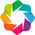

In [71]:
hv.extension("bokeh")

### Pathway co-occurance

#### Generate data

In [5]:
pw_data = pd.read_excel("pathway_co_occurence__1990_2022.xlsx")

In [6]:
pw_data2 = pw_data.set_index('Unnamed: 0')

In [7]:
pw_data2.head()

,Avoided forest conversion,Forest Reforestation & Rehabilitation,Natural forest management,Improved plantations,Fire management,Avoided/sustainable woodfuel harvest,"Avoided grassland, savannas, shrublands conversion",Biochar,Cropland nutrient management,Conservation agriculture,...,Grazing – legumes in pastures,Grazing – improved feed,Grazing – animal management,Improved rice cultivation,Avoided coastal wetland impacts & conversion,Avoided freshwater wetlands impacts,Coastal wetlands restoration & rehabilitation,Freshwater wetlands restoration,Grassland restoration and rehabilitation,Afforestation
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
Avoided forest conversion,0,56498,80696,11603,366,0,11744,2595,5710,19058,...,0,0,0,0,1597,3731,5050,5050,10571,15729
Forest Reforestation & Rehabilitation,56498,0,74292,19612,366,0,7608,591,6301,6602,...,0,0,938,0,1597,3731,5050,5050,8906,21335
Natural forest management,80696,74292,0,49594,21984,4226,10551,548,5710,27147,...,0,0,2169,0,0,3611,3453,3453,10571,19778
Improved plantations,11603,19612,49594,0,366,4558,958,1139,1611,7746,...,0,0,0,0,0,0,0,0,958,4738
Fire management,366,366,21984,366,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [8]:
pw_pairs = []
pw_c_list = list(pw_data2.columns)
pw_c_list_len = len(pw_c_list)

pw_df_data = []

for i in range(len(pw_c_list) - 1):
    c = pw_c_list[i]
    for ii in range(i+1, pw_c_list_len):
        
        pw_df_data.append([c, pw_c_list[ii], pw_data2[c][pw_c_list[ii]]])

In [9]:
pw_df = pd.DataFrame(pw_df_data, columns=["source", "target", "weight"])

In [10]:
pw_df.head()

,source,target,weight
0,Avoided forest conversion,Forest Reforestation & Rehabilitation,56498
1,Avoided forest conversion,Natural forest management,80696
2,Avoided forest conversion,Improved plantations,11603
3,Avoided forest conversion,Fire management,366
4,Avoided forest conversion,Avoided/sustainable woodfuel harvest,0


#### Generate plot

In [42]:
hv.extension("matplotlib")

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

In [90]:
def rotate_label(plot, element):
    white_space = "                                   "
    angles = plot.handles['text_1_source'].data['angle']
    characters = np.array(plot.handles['text_1_source'].data['text'])
    plot.handles['text_1_source'].data['text'] = np.array([x + white_space if x in characters[np.where((angles < -1.5707963267949) | (angles > 1.5707963267949))] else x for x in plot.handles['text_1_source'].data['text']])
    plot.handles['text_1_source'].data['text'] = np.array([white_space + x if x in characters[np.where((angles > -1.5707963267949) | (angles < 1.5707963267949))] else x for x in plot.handles['text_1_source'].data['text']])
    angles[np.where((angles < -1.5707963267949) | (angles > 1.5707963267949))] += 3.1415926535898
    plot.handles['text_1_glyph'].text_align = "center"

In [53]:
def rotate_label(plot, element):
    labels = plot.handles['labels']
    for annotation in labels:
        angle = annotation.get_rotation()
        if 90 < angle < 270:
            annotation.set_rotation(180 + angle)
            annotation.set_horizontalalignment("right")

In [59]:
hv.output(size=500)

In [60]:
pw_nodes = hv.Dataset(list(pw_data2.columns), "index")

In [61]:
pw_chord = hv.Chord((pw_df, pw_nodes)).select(value=(5, None))

:Chord   [source,target]   (value)
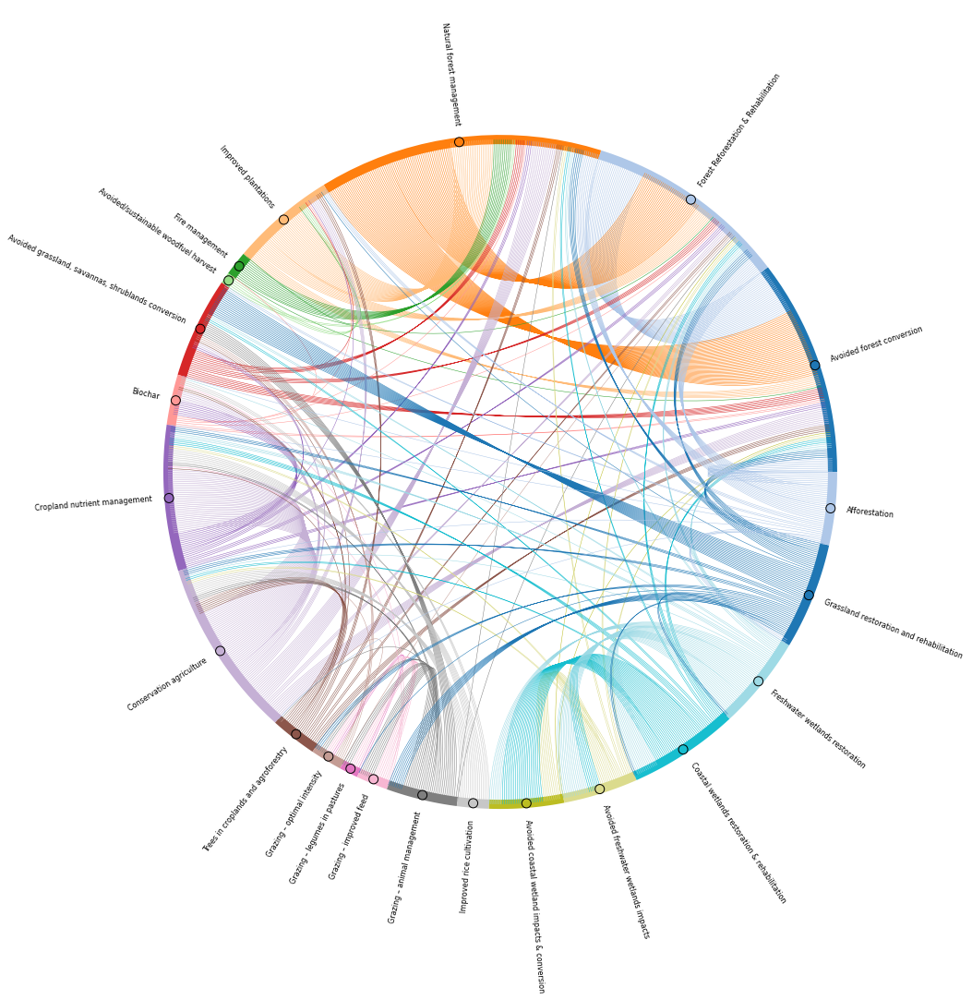

In [62]:
# chord.opts(fontscale=2, width=800, height=800, title='Collaborative Network')
# pw_chord.opts(label_text_font_size='15pt')
pw_chord.opts(opts.Chord(cmap='Category20', edge_cmap='Category20', edge_color=dim('target').str(), labels='index', node_color=dim('index').str(), hooks=[rotate_label]))

#### Saving the figure

In [63]:
hv.save(pw_chord, 'pw_chord_plot.png', fmt='png')

### Cobenefit co-occurance

#### Generate data

In [26]:
cb_data = pd.read_excel("cobenefit_co_occurence__1990_2022.xlsx")

In [29]:
cb_data.head()

,Cobenefits,General human well-being,Economic living standards,Material living standards,Health,Education,Social relations,Security and safety,Subjective well-being,Culture and spirituality,Environmental co-benefits,Biodiversity co-benefits
0,General human well-being,0,23033,28025,7213,2239,0,21317,23009,17956,26714,23180
1,Economic living standards,23033,0,272193,32447,25013,27487,33581,34741,29265,226885,82065
2,Material living standards,28025,272193,0,27951,21327,24215,39777,29504,28383,288246,97162
3,Health,7213,32447,27951,0,17399,14702,12922,20649,5473,51733,24124
4,Education,2239,25013,21327,17399,0,11613,9035,10833,6623,22450,13457


In [31]:
cb_data2 = cb_data.set_index('Cobenefits')

In [32]:
cb_data2.head()

,General human well-being,Economic living standards,Material living standards,Health,Education,Social relations,Security and safety,Subjective well-being,Culture and spirituality,Environmental co-benefits,Biodiversity co-benefits
Cobenefits,,,,,,,,,,,
General human well-being,0,23033,28025,7213,2239,0,21317,23009,17956,26714,23180
Economic living standards,23033,0,272193,32447,25013,27487,33581,34741,29265,226885,82065
Material living standards,28025,272193,0,27951,21327,24215,39777,29504,28383,288246,97162
Health,7213,32447,27951,0,17399,14702,12922,20649,5473,51733,24124
Education,2239,25013,21327,17399,0,11613,9035,10833,6623,22450,13457


In [33]:
cb_pairs = []
cb_c_list = list(cb_data2.columns)
cb_c_list_len = len(cb_c_list)

cb_df_data = []

for i in range(len(cb_c_list) - 1):
    c = cb_c_list[i]
    for ii in range(i+1, cb_c_list_len):
        
        cb_df_data.append([c, cb_c_list[ii], cb_data2[c][cb_c_list[ii]]])

In [34]:
cb_df = pd.DataFrame(cb_df_data, columns=["source", "target", "value"])

In [35]:
cb_df.head()

,source,target,value
0,General human well-being,Economic living standards,23033
1,General human well-being,Material living standards,28025
2,General human well-being,Health,7213
3,General human well-being,Education,2239
4,General human well-being,Social relations,0


#### Generate plot

In [40]:
hv.output(size=500)

In [37]:
cb_nodes = hv.Dataset(list(cb_data2.columns), "index")

In [38]:
cb_chord = hv.Chord((cb_df, cb_nodes)).select(value=(5, None))

In [41]:
# chord.opts(fontscale=2, width=800, height=800, title='Collaborative Network')
cb_chord.opts(label_text_font_size='15pt')
cb_chord.opts(opts.Chord(cmap='Category20', edge_cmap='Category20', edge_color=dim('source').str(), labels='index', node_color=dim('index').str()))

:Chord   [source,target]   (value)

#### Saving the figure

In [42]:
hv.save(cb_chord, 'cb_chord_plot.png', fmt='png')

In [1]:
import pandas as pd
import numpy as np

In [2]:
pw_data = pd.read_excel("pathway_co_occurence__1990_2022.xlsx")

In [3]:
pw_data2 = pw_data.set_index('Unnamed: 0')

In [4]:
pw_data2.head()

,F Avoided forest conversion,F Forest Reforestation & Rehabilitation,F Natural forest management,F Improved plantations,F Fire management,F Avoided/sustainable woodfuel harvest,"GL Avoided grassland, savannas, shrublands conversion",CL Biochar,CL Cropland nutrient management,CL Conservation agriculture,...,GL Grazing – legumes in pastures,GL Grazing – improved feed,GL Grazing – animal management,WL Improved rice cultivation,WL Avoided coastal wetland impacts & conversion,WL Avoided freshwater wetlands impacts,WL Coastal wetlands restoration & rehabilitation,WL Freshwater wetlands restoration,GL Grassland restoration and rehabilitation,F Afforestation
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
F Avoided forest conversion,0,56498,80696,11603,366,0,11744,2595,5710,19058,...,0,0,0,0,1597,3731,5050,5050,10571,15729
F Forest Reforestation & Rehabilitation,56498,0,74292,19612,366,0,7608,591,6301,6602,...,0,0,938,0,1597,3731,5050,5050,8906,21335
F Natural forest management,80696,74292,0,49594,21984,4226,10551,548,5710,27147,...,0,0,2169,0,0,3611,3453,3453,10571,19778
F Improved plantations,11603,19612,49594,0,366,4558,958,1139,1611,7746,...,0,0,0,0,0,0,0,0,958,4738
F Fire management,366,366,21984,366,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [5]:
pw_pairs = []
pw_c_list = list(pw_data2.columns)
pw_c_list_len = len(pw_c_list)

pw_df_data = []

for i in range(len(pw_c_list) - 1):
    c = pw_c_list[i]
    for ii in range(i+1, pw_c_list_len):
        
        pw_df_data.append([c, pw_c_list[ii], pw_data2[c][pw_c_list[ii]]])

In [6]:
pw_df = pd.DataFrame(pw_df_data, columns=["source", "target", "weight"])

In [7]:
pw_df.head()

,source,target,weight
0,F Avoided forest conversion,F Forest Reforestation & Rehabilitation,56498
1,F Avoided forest conversion,F Natural forest management,80696
2,F Avoided forest conversion,F Improved plantations,11603
3,F Avoided forest conversion,F Fire management,366
4,F Avoided forest conversion,F Avoided/sustainable woodfuel harvest,0


In [8]:
green_color = "#617143"
blue_color = "#146C94"
brown_color = "#B99B6B"
gold_color = "#E6B325"

In [9]:
anthrome_dict = {"grassland": ["GL Avoided grassland, savannas, shrublands conversion", "GL Grassland restoration and rehabilitation", "GL Grazing – optimal intensity",
                              "GL Grazing – legumes in pastures", "GL Grazing – improved feed", "GL Grazing – animal management"],
                 "cropland": ["CL Biochar", "CL Cropland nutrient management", "CL Conservation agriculture", "CL Trees in croplands and agroforestry"],
                 "forest": ["F Avoided forest conversion", "F Forest Reforestation & Rehabilitation", "F Natural forest management", "F Improved plantations", "F Fire management", "F Avoided/sustainable woodfuel harvest", "F Afforestation"],
                 "wetland": ["WL Improved rice cultivation", "WL Avoided coastal wetland impacts & conversion", "WL Avoided freshwater wetlands impacts", "WL Coastal wetlands restoration & rehabilitation", "WL Freshwater wetlands restoration"]}

In [10]:
color_dict = {"grassland": gold_color,
              "cropland": brown_color,
              "forest": green_color,
              "wetland": blue_color}

In [11]:
pw_df_final = pd.DataFrame(columns=["source", "target", "weight"])

for k in anthrome_dict.keys():
    for src in anthrome_dict[k]:
        tar_l = pw_df[pw_df["source"] == src]
        pw_df_final = pd.concat([pw_df_final, tar_l])

In [13]:
from d3blocks import D3Blocks
#
# Initialize
d3 = D3Blocks(chart="Chord", frame=False)
d3.config["figsize"] = [900, 900]


# Node properties
d3.set_node_properties(pw_df_final, opacity=0.8, cmap='tab20')
d3.set_edge_properties(pw_df_final, color='source', opacity='source')

for k in anthrome_dict.keys():
    for vv in anthrome_dict[k]:
        d3.node_properties.get(vv)['color']=color_dict[k]

for k in anthrome_dict.keys():
    for src in anthrome_dict[k]:
        tar_l = pw_df_final[pw_df_final["source"] == src]["target"].tolist()
        for tar in tar_l:
            # print(src, " --- ", tar)
            d3.edge_properties.get((src, tar))['color'] = color_dict[k]
            d3.edge_properties.get((src, tar))['opacity'] = 0.6

d3.show()

[d3blocks] >INFO> Cleaning edge_properties and config parameters..
[d3blocks] >INFO> Initializing [Chord]
[d3blocks] >INFO> filepath is set to [C:\Users\User\AppData\Local\Temp\d3blocks\chord.html]
[d3blocks] >INFO> Node properties are set.
[d3blocks] >INFO> Convert to Dictionary.
[d3blocks] >INFO> Edge properties are set.
[d3blocks] >INFO> File already exists and will be overwritten: [C:\Users\User\AppData\Local\Temp\d3blocks\chord.html]
[d3blocks] >INFO> Open browser: C:\Users\User\AppData\Local\Temp\d3blocks\chord.html
